In [1]:
%matplotlib inline

In [7]:
import glob
import pickle
import numpy as np
import pylab as plt

from IPython.display import HTML
from matplotlib import animation, rc
from matplotlib.dates import DateFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable

from astropy.io import fits
from natsort import natsorted
from astropy import units as u
from astropy.time import Time, TimeDelta

import sys
sys.path.append('/home/scratch/psalas/LASSI/lassi-analysis_v2')

from utils.utils import midPoint
from simulateSignal import zernikePoly
from plotting import MidpointNormalize
from lassiAnalysis import extractZernikesLeicaScanPair
from analyzeActiveSurface import processActiveSurfaceFITSPair

In [3]:
def process(maskRadius, sigma, signal_registration, signal_type, 
            fixed_reference=False, refScanFile=None):
    
    # Use the .zernike.fits files to select signal scans.
    zern_files = natsorted(glob.glob("{0}/LASSI/*.zernike.fits".format(fitsDir)))[3:]
    
    # Use all the fits files to select reference scans.
    fits_files = natsorted(glob.glob("{0}/LASSI/*.fits".format(fitsDir)))[19:-12]
    fits_files = [ff for ff in fits_files if "zernike" not in ff and "smoothed" not in ff]
    
    # Load the ScanLog
    hdu = fits.open("{0}/ScanLog.fits".format(fitsDir))
    scanArr = hdu[1].data
    
    zFitDict = {}
    zFitDict['header'] = {'scan0': scan0, 'scanf': scanf, 'nZern': nZern,
                          'signal_registration': signal_registration,
                          'sigma_clip_diff': sigma_clip_diff,
                          'kernel_size': kernel_size,
                          'do_replace_nans': do_replace_nans,
                          'guess': guess, 'maskRadius': maskRadius,
                          'fixed_reference': fixed_reference,
                          'reference_scan_file': refScanFile,
                          'signal_type': signal_type,
                          'sigma': sigma}
    
    # Get the Zernike coefficients from the active surface.
    z_idx = np.zeros((len(zern_files)), dtype=np.int)
    scans = np.zeros((len(zern_files)), dtype=np.int)

    z_as = np.zeros((len(zern_files), nZern-1), dtype=np.float)
    z_lassi = np.zeros((len(zern_files), nZern), dtype=np.float)
    z_as_obs = np.zeros((len(zern_files), nZern), dtype=np.float)

    z_in = np.zeros(len(zern_files), dtype=np.float)
    z_in_as = np.zeros(len(zern_files), dtype=np.float)
    z_obs = np.zeros(len(zern_files), dtype=np.float)
    
    for i, zf in enumerate(zern_files):

        hdu = fits.open(zf)
        head = hdu[0].header
        z_lassi[i] = hdu[2].data['value']
        scans[i] = head['MC_SCAN']

        idx = np.where(scanArr['SCAN'] == scans[i])[0][0]
        idx_as = idx - 3
        sig_scan = scanArr['SCAN'][idx_as]
        ref_scan = scanArr['SCAN'][idx_as-6]

        # Load the AS fits file for the signal scan.
        as_file = file = '/'.join(scanArr[idx_as]['FILEPATH'].split('/')[-2:])
        hdu = fits.open("{0}/{1}".format(fitsDir, as_file))
        z_as[i] = hdu[1].data['value']

        # The AS Zernike contents start at Z1, not Z0.
        # The LASSI Zernike start at Z0.
        z_idx[i] = np.where(z_as[i] != 0)[0]

        as_file_sig = '/'.join(scanArr[idx_as]['FILEPATH'].split('/')[-2:])
        as_file_ref = '/'.join(scanArr[idx_as - 6]['FILEPATH'].split('/')[-2:])
        #print(as_file_sig, as_file_ref)
        xas, yas, aas, aar, fitlist = processActiveSurfaceFITSPair("{0}/{1}".format(fitsDir, as_file_ref), 
                                                                   "{0}/{1}".format(fitsDir, as_file_sig), 
                                                                   column='ABSOLUTE', filterDisabled=True, 
                                                                   verbose=False, plot=False)
        z_as_obs[i] = fitlist

        z_in[i] = z_as[i][z_idx[i]]
        z_in_as[i] = z_as_obs[i][z_idx[i]+1]*1e6 # microns
        z_obs[i] = z_lassi[i][z_idx[i]+1]

        zFitDict[scans[i]] = {'input zernike': z_idx[i] + 1,
                              'input zernike value': z_as[i][z_idx[i]],
                              'active surface zernike value': abs(z_in_as[i]),
                              'active surface reference scan': ref_scan,
                              'active surface signal scan': sig_scan,
                              'active surface dz': (aar - aas).T,
                              'active surface x': xas,
                              'active surface y': yas
                             }

    all_files = zern_files
    
    # Measure Zernike coefficients from the scans.
    for i, ff in enumerate(all_files):

        sf = ff.replace(".zernike.fits", ".fits")
        sigScanFile = "{0}/{1}".format(scanDir, sf.split('/')[-1].replace('.fits', '.ptx.csv'))
        # Find the corresponding reference scan.
        hdu = fits.open(sf)
        head = hdu[0].header
        scan = head['SCAN']
        refScan = head['RSCANNUM']
                
        rf = scanArr[np.where(scanArr['SCAN'] == refScan)[0][0]][2].split('/')[-1]
        refScanFile =  "{0}/{1}".format(scanDir, rf.replace('.fits', '.ptx.csv'))            

        x,y,dz,fl = extractZernikesLeicaScanPair(refScanFile, sigScanFile, n=n, nZern=nZern, 
                                                 pFitGuess=guess, rMaskRadius=maskRadius,
                                                 signal_registration=signal_registration,
                                                 **{'sigma':sigma}, verbose=True)


        zFitDict[scan]['recovered zernike'] = fl

        iz = zFitDict[scan]['input zernike']
        izv = zFitDict[scan]['input zernike value']
        zFitDict[scan]['recovered zernike difference'] = (fl[iz]*1e6 - izv)/izv

        izv = zFitDict[scan]['active surface zernike value']
        zFitDict[scan]['recovered zernike difference AS'] = (fl[iz]*1e6 - izv)/izv

        zFitDict[scan]['deformation map rms'] = np.nanstd(dz.filled(np.nan))
            
        zFitDict[scan]['deformation map'] = dz
        zFitDict[scan]['deformation map x'] = x
        zFitDict[scan]['deformation map y'] = y
        
    return zFitDict

In [4]:
n = 512     # Use a nxn grid.
nZern = 37  # Only fit for 36 Zernike terms.
scan0 = 16
scanf = 125
signal_registration = False
sigma_clip_diff = False
kernel_size = 1
do_replace_nans = False
guess = [60., 0., 0., -50., 0., 0.]
fixed_reference = False
signal_type = b'SIGNAL'
scanDir = '/home/scratch/psalas/LASSI/gpus/output/'
fitsDir = '/home/gbtdata/TLASSI_200315'
refScanFile = '/home/scratch/psalas/LASSI/gpus/output/2020_03_16_02:21:06.ptx.csv'

In [5]:
%%time
zFitDict = process(50, 3, signal_registration, signal_type, 
                   fixed_reference=fixed_reference, refScanFile=refScanFile)

Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_02:21:06.ptx.csv
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_02:28:31.ptx.csv
Computing Zernike coefficients.
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_02:54:59.ptx.csv
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_03:02:51.ptx.csv
Computing Zernike coefficients.
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_03:19:50.ptx.csv
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_03:27:25.ptx.csv
Computing Zernike coefficients.
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_03:44:25.ptx.csv
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_03:52:01.ptx.csv
Computing Zernike coefficients.
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_04:09:06.ptx.csv
Masking file: /home/scratch/psalas/LASSI/gpus/output//2020_03_16_04:16:39.ptx.csv
Computing Zernike coefficients.
Masking file: /home/

In [53]:
pickle.dump(zFitDict, open("zFitDict_animation.pickle", "wb"))

In [8]:
scans = list(zFitDict.keys())[1:]

In [26]:
plt.figure()

foo = scipy.ndimage.zoom(dzas.T, 3)
foo.shape

(1536, 1536)

<Figure size 432x288 with 0 Axes>

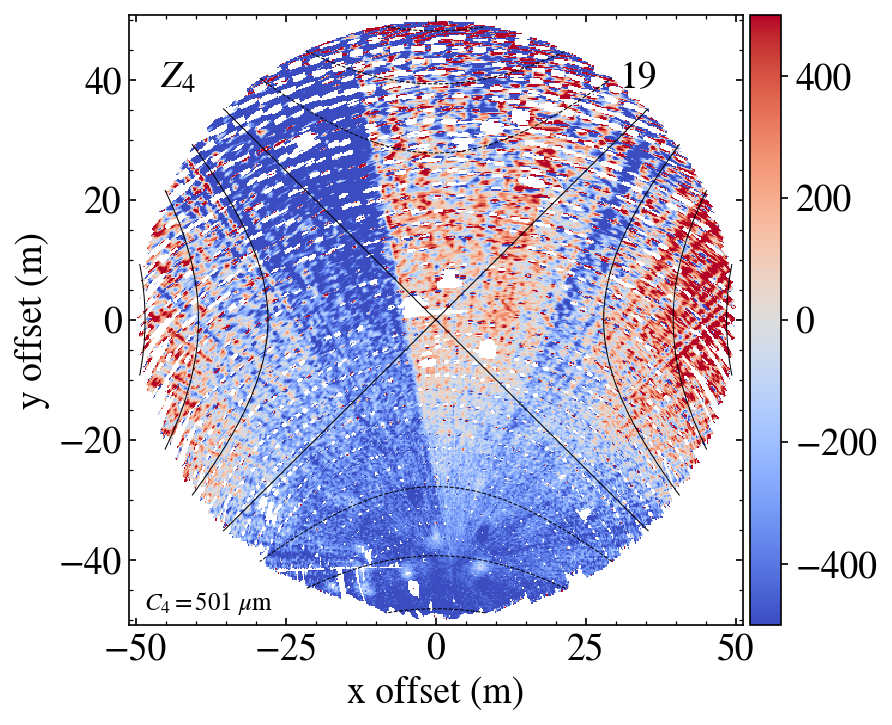

In [51]:
import matplotlib
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
matplotlib.rcParams.update({'font.size': 18})

cmap = plt.matplotlib.cm.coolwarm
cmap.set_bad(color='white')

vmin = -500
vmax = 500
norm = MidpointNormalize(midpoint=0, vmin=vmin, vmax=vmax)

x = zFitDict[scans[0]]['deformation map x']
y = zFitDict[scans[0]]['deformation map y']
xc = midPoint(x)
yc = midPoint(y)
x -= xc
y -= yc
extent = [np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)]
xc = midPoint(x)
yc = midPoint(y)

# Plot
fig = plt.figure(figsize=(6,6.5), dpi=150, frameon=False)

ax1 = fig.add_subplot(111)

im = ax1.imshow(zFitDict[scans[0]]['deformation map']*1e6, origin='lower', vmin=vmin, vmax=vmax, cmap=cmap, 
                extent=extent, aspect="equal", norm=norm)

divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im, cax=cax)

iz = zFitDict[scans[0]]['input zernike']
izvas = zFitDict[scans[0]]['active surface zernike value']
coefs = np.zeros(36)
coefs[iz] = izvas
zpoly = zernikePoly(x, y, xc, yc, coefs)
mask = (x - xc)**2 + (y - yc)**2 > 50**2
zpoly[mask] = np.nan

xas = zFitDict[scans[0]]['active surface x']
yas = zFitDict[scans[0]]['active surface y']
dzas = zFitDict[scans[0]]['active surface dz']

from scipy.ndimage.filters import gaussian_filter

cntr = [ ax1.contour(x, y, zpoly.T, colors='k', linewidths=0.5),
       #  ax1.contour(yas.T+xc, xas.T+2*yc, gaussian_filter(dzas.T, 3), colors='Gold', linewidths=1)
       ]

txt_s = ax1.text(0.8, 0.88, scans[0], transform=ax1.transAxes)
zlab = "$Z_{{{}}}$".format(iz)
txt_z = ax1.text(0.05, 0.88, zlab, transform=ax1.transAxes)
clab = "$C_{{{}}}={:.0f}~\mu$m".format(iz, izvas)
txt_c = ax1.text(0.025, 0.025, clab, transform=ax1.transAxes, size=12)

ax1.minorticks_on()
ax1.tick_params('both', direction='in', which='both', top=True, right=True, left=True, bottom=True)
ax1.set_xlabel('x offset (m)')
ax1.set_ylabel('y offset (m)')

fig.tight_layout(pad=0.5)
#fig.subplots_adjust(left=0.16, bottom=0, right=1, top=1, wspace=None, hspace=None)

plt.show();

In [52]:
def update_surface(frame):
    """
    Updates the values of the surface's image for a given frame.
    """

    x = zFitDict[scans[frame]]['deformation map x']
    y = zFitDict[scans[frame]]['deformation map y']
    xc = midPoint(x)
    yc = midPoint(y)
    x -= xc
    y -= yc
    extent = [np.nanmin(x), np.nanmax(x), np.nanmin(y), np.nanmax(y)]
    xc = midPoint(x)
    yc = midPoint(y)

    im.set_array(zFitDict[scans[frame]]['deformation map']*1e6)
    im.set_extent(extent)

    iz = zFitDict[scans[frame]]['input zernike']
    izvas = zFitDict[scans[frame]]['active surface zernike value']
    coefs = np.zeros(36)
    coefs[iz] = izvas
    zpoly = zernikePoly(x, y, xc, yc, coefs)
    mask = (x - xc)**2 + (y - yc)**2 > 50**2
    zpoly[mask] = np.nan

    xas = zFitDict[scans[frame]]['active surface x']
    yas = zFitDict[scans[frame]]['active surface y']
    dzas = zFitDict[scans[frame]]['active surface dz']

    # Remove old contours.
    for c in cntr:
        for tp in c.collections:
            tp.remove()

    cntr[0] = ax1.contour(x, y, zpoly.T, colors='k', linewidths=0.5)
    #cntr[1] = ax1.contour(yas.T+xc, xas.T+2*yc, gaussian_filter(dzas.T, 3), colors='Gold', linewidths=1)

    txt_s.set_text(scans[frame])
    zlab = "$Z_{{{}}}$".format(iz)
    txt_z.set_text(zlab)
    clab = "$C_{{{}}}={:.0f}~\mu$m".format(iz, izvas)
    txt_c.set_text(clab)

rc('animation', embed_limit=20971520.0*4)

# Make a movie of the surface
ani = animation.FuncAnimation(fig, update_surface, frames=len(scans)-1, 
                              interval=100, repeat=True)
HTML(ani.to_jshtml())

/home/scratch/psalas/LASSI/lassi-analysis_v2/psalas_lassi_env/lib/python3.7/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
